## Análisis y Tratamiento de Imágenes Satelitales

## TP4

### 1. Implementar la transformada de Hough para detectar rectas y aplicarla a la imagen Test.

La transformada de Hough es un pilar clásico en procesamiento digital de imágenes y visión por computadora, especialmente para detección de formas geométricas. Es un método algorítmico para detectar formas paramétricas simples en una imagen como líneas rectas, círculos, elipses y otras curvas con representación matemática conocida.

In [ ]:
import cv2
import numpy as np
from scipy.ndimage import convolve
import matplotlib.pyplot as plt

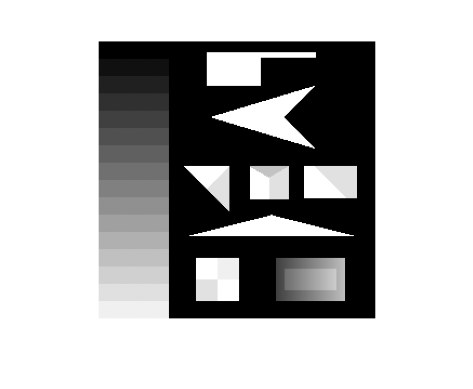

In [ ]:
# Como primer paso se selecciona la imagen de prueba

img = cv2.imread("C:/Users/arnic/Desktop/Ariel/MCD/13 - A y T de Imagenes satelitales/TP 4/test.png")
gris = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# Así entonces, se puede desplegar la imagen seleccionada
plt.imshow(gris, cmap='gray')
plt.axis('off') 
plt.show()

In [65]:
# Se aplica el detector de bordes de Canny

bordes = cv2.Canny(gris, 50, 150, apertureSize=3)

# Se aplica Transformada de Hough (clásica)

lineas1 = cv2.HoughLines(bordes, rho=1, theta=np.pi/180, threshold=100)

In [66]:
# Se dibujan las líneas detectadas sobre la imagen original

imagen_lineas1 = img.copy()

if lineas1 is not None:
    for linea in lineas1:
        rho, theta = linea[0]
        a = np.cos(theta)
        b = np.sin(theta)
        x0 = a * rho
        y0 = b * rho
        # Puntos extremos de la línea
        x1 = int(x0 + 1000 * (-b))
        y1 = int(y0 + 1000 * (a))
        x2 = int(x0 - 1000 * (-b))
        y2 = int(y0 - 1000 * (a))

        cv2.line(imagen_lineas1, (x1, y1), (x2, y2), (0, 0, 255), 2)


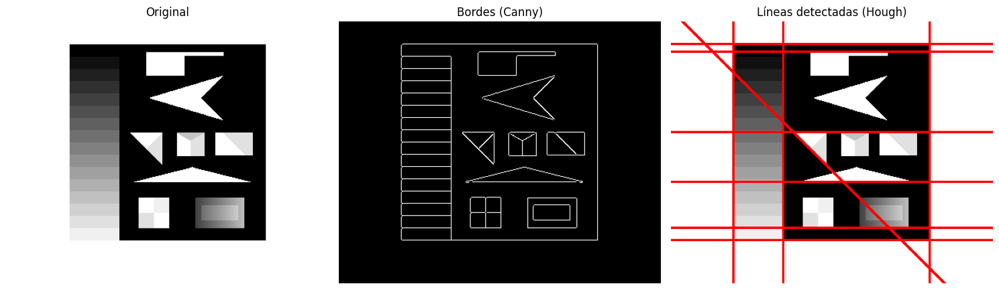

In [67]:
# Se observan los resultados

plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.title('Original')
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.axis('off')

plt.subplot(1, 3, 2)
plt.title('Bordes (Canny)')
plt.imshow(bordes, cmap='gray')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.title('Líneas detectadas (Hough)')
plt.imshow(cv2.cvtColor(imagen_lineas1, cv2.COLOR_BGR2RGB))
plt.axis('off')

plt.tight_layout()
plt.show()

In [68]:
# Se modifica el valor de threshold para analizar la detección de líneas:

lineas2 = cv2.HoughLines(bordes, rho=1, theta=np.pi/180, threshold=50)
lineas3 = cv2.HoughLines(bordes, rho=1, theta=np.pi/180, threshold=150)

# Se dibujan las líneas detectadas sobre la imagen original

imagen_lineas2 = img.copy()

if lineas2 is not None:
    for linea in lineas2:
        rho, theta = linea[0]
        a = np.cos(theta)
        b = np.sin(theta)
        x0 = a * rho
        y0 = b * rho
        # Puntos extremos de la línea
        x1 = int(x0 + 1000 * (-b))
        y1 = int(y0 + 1000 * (a))
        x2 = int(x0 - 1000 * (-b))
        y2 = int(y0 - 1000 * (a))

        cv2.line(imagen_lineas2, (x1, y1), (x2, y2), (0, 0, 255), 2)
        
imagen_lineas3 = img.copy()

if lineas3 is not None:
    for linea in lineas3:
        rho, theta = linea[0]
        a = np.cos(theta)
        b = np.sin(theta)
        x0 = a * rho
        y0 = b * rho
        # Puntos extremos de la línea
        x1 = int(x0 + 1000 * (-b))
        y1 = int(y0 + 1000 * (a))
        x2 = int(x0 - 1000 * (-b))
        y2 = int(y0 - 1000 * (a))

        cv2.line(imagen_lineas3, (x1, y1), (x2, y2), (0, 0, 255), 2)

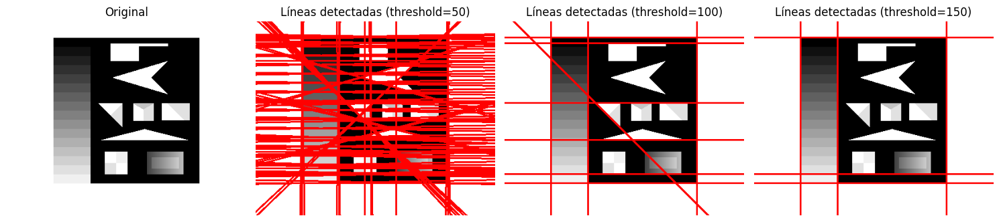

In [69]:
# Se observan los resultados

plt.figure(figsize=(15, 5))

plt.subplot(1, 4, 1)
plt.title('Original')
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.axis('off')

plt.subplot(1, 4, 2)
plt.title('Líneas detectadas (threshold=50)')
plt.imshow(cv2.cvtColor(imagen_lineas2, cv2.COLOR_BGR2RGB))
plt.axis('off')

plt.subplot(1, 4, 3)
plt.title('Líneas detectadas (threshold=100)')
plt.imshow(cv2.cvtColor(imagen_lineas1, cv2.COLOR_BGR2RGB))
plt.axis('off')

plt.subplot(1, 4, 4)
plt.title('Líneas detectadas (threshold=150)')
plt.imshow(cv2.cvtColor(imagen_lineas3, cv2.COLOR_BGR2RGB))
plt.axis('off')

plt.tight_layout()
plt.show()

In [ ]:
# En las imágenes resultantes se observa que a medida que aumenta el valor de umbralización (threshold), se detectan menor cantidad de líneas. Esto se debe a que el 
# parámetro threshold indica el número mínimo de puntos alineados que forman una línea.

### Transformada de Hough Probabilística

Otra implementación es el método probabilístico de la transformada de Hough, en este caso la función recibe dos parámetros extras, minLineLength que establece la longitud mínima de la línea y maxLineGap que indica el intervalo máximo de líneas para tratarlas como una sola.

In [ ]:
# Se aplica la Transformada de Hough Probabilística

# Devuelve segmentos de línea: (x1, y1, x2, y2)

lineasP = cv2.HoughLinesP(
    bordes,
    rho=1,               # resolución en píxeles de rho
    theta=np.pi/180,     # resolución angular en radianes
    threshold=50,        # umbral mínimo de puntos alineados
    minLineLength=40,    # longitud mínima para aceptar una línea
    maxLineGap=10        # separación máxima entre segmentos que se unirán como una única línea
)

In [ ]:
# Se dibujan los segmentos sobre la imagen original

imagen_lineasP = img.copy()

if lineasP is not None:
    for linea in lineasP:
        x1, y1, x2, y2 = linea[0]
        cv2.line(imagen_lineasP, (x1, y1), (x2, y2), (0, 255, 0), 2)

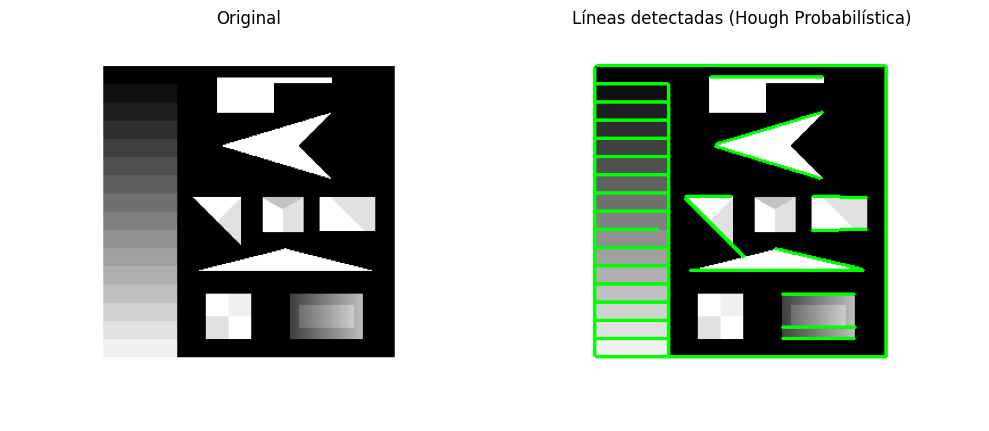

In [ ]:
# Se muestran los resultados

plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.title('Original')
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.axis('off')

plt.subplot(1, 2, 2)
plt.title('Líneas detectadas (Hough Probabilística)')
plt.imshow(cv2.cvtColor(imagen_lineasP, cv2.COLOR_BGR2RGB))
plt.axis('off')

plt.tight_layout()
plt.show()

In [ ]:
# De esta manera se puede observar que el método clásico de Hough (HoughLines) se puede utilizar cuando se quieren encontrar líneas infinitas 
# (para análisis estructural, detección de carriles), mientras que se puede utilizar el método probabilístico de la transformada de Hough (HoughLinesP) 
# cuando se quiere segmentos reales, p.ej. bordes de objetos, piezas industriales, documentos escaneados.

### Detección de círculos

In [ ]:
# Se carga la imagen seleccionada en escala de grises

bubbles = cv2.imread("C:/Users/arnic/Desktop/Ariel/MCD/13 - A y T de Imagenes satelitales/TP 4/bubbles.jpg")
gray = cv2.cvtColor(bubbles, cv2.COLOR_BGR2GRAY)

# Se suaviza para reducir ruido

gris_blur = cv2.medianBlur(gray, 5)

# Se detectan círculos con HoughCircles

# Método cv2.HOUGH_GRADIENT usa el gradiente de intensidad
circulos = cv2.HoughCircles(
    gris_blur,
    method=cv2.HOUGH_GRADIENT,
    dp=1.2,           # relación inversa resolución acumulador / imagen
    minDist=30,       # distancia mínima entre centros de círculos detectados
    param1=50,        # umbral alto para Canny (bordes)
    param2=30,        # umbral acumulador para centro de círculos
    minRadius=10,     # radio mínimo
    maxRadius=100     # radio máximo
)

In [ ]:
# Se dibujan los círculos detectados

imagen_circulos = bubbles.copy()

if circulos is not None:
    circulos = np.round(circulos[0, :]).astype("int")
    for (x, y, r) in circulos:
        # Círculo
        cv2.circle(imagen_circulos, (x, y), r, (0, 255, 0), 2)
        # Centro
        cv2.circle(imagen_circulos, (x, y), 2, (0, 0, 255), 3)

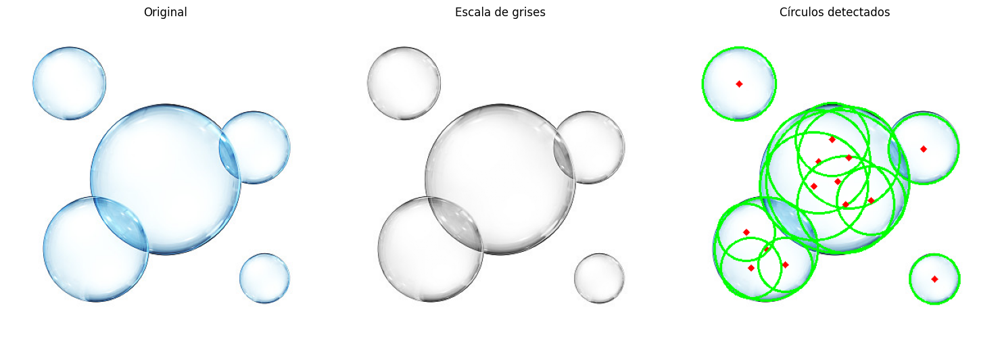

In [ ]:
# Se muestran los resultados

plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.title('Original')
plt.imshow(cv2.cvtColor(bubbles, cv2.COLOR_BGR2RGB))
plt.axis('off')

plt.subplot(1, 3, 2)
plt.title('Escala de grises')
plt.imshow(gray, cmap='gray')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.title('Círculos detectados')
plt.imshow(cv2.cvtColor(imagen_circulos, cv2.COLOR_BGR2RGB))
plt.axis('off')

plt.tight_layout()
plt.show()

In [ ]:
# En estas imágenes se observa cómo el método de Hough detectan los círculos formados por las burbujas pero también se detectan falsos círculos.

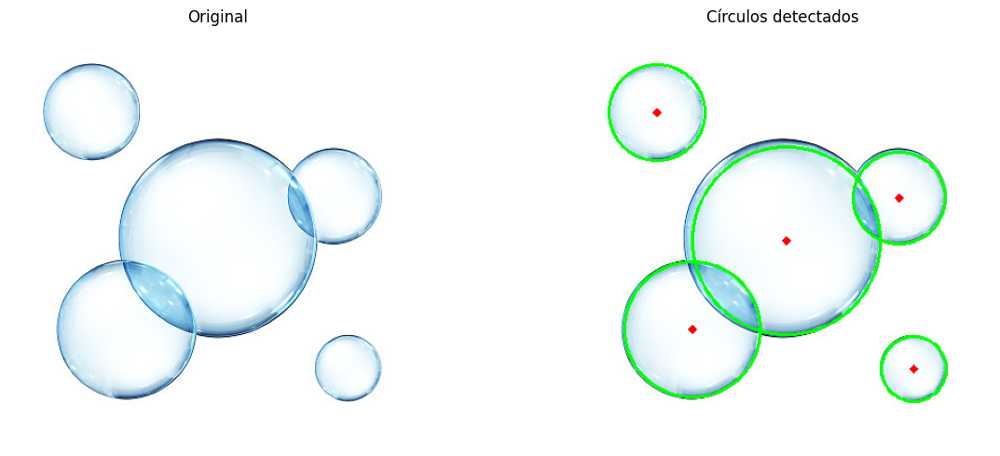

In [96]:
# Se modifican los parámetros del método para corregir los falsos círculos.

circulos2 = cv2.HoughCircles(
    gris_blur,
    method=cv2.HOUGH_GRADIENT,
    dp=1.2,           # relación inversa resolución acumulador / imagen
    minDist=70,       # distancia mínima entre centros de círculos detectados
    param1=50,        # umbral alto para Canny (bordes)
    param2=30,        # umbral acumulador para centro de círculos
    minRadius=10,     # radio mínimo
    maxRadius=100     # radio máximo
)

# Se dibujan los círculos detectados

imagen_circulos2 = bubbles.copy()

if circulos2 is not None:
    circulos2 = np.round(circulos2[0, :]).astype("int")
    for (x, y, r) in circulos2:
        # Círculo
        cv2.circle(imagen_circulos2, (x, y), r, (0, 255, 0), 2)
        # Centro
        cv2.circle(imagen_circulos2, (x, y), 2, (0, 0, 255), 3)
        
# Se muestran los resultados

plt.figure(figsize=(13, 5))

plt.subplot(1, 2, 1)
plt.title('Original')
plt.imshow(cv2.cvtColor(bubbles, cv2.COLOR_BGR2RGB))
plt.axis('off')

plt.subplot(1, 2, 2)
plt.title('Círculos detectados')
plt.imshow(cv2.cvtColor(imagen_circulos2, cv2.COLOR_BGR2RGB))
plt.axis('off')

plt.tight_layout()
plt.show()

In [ ]:
# En este caso en particular, modificando la distancia mínima entre centros de círculos detectados (minDist) se pueden detectar los círculos
# que aparecen en la imagen de manera mas precisa.

### 2. Utilizar el método SIFT para reconocimiento de objetos en una imagen. La idea de este ejercicio es reconocer si dos imágenes son, en realidad, la misma. Esto puede realizarse contando los descriptores de cada una y las coincidencias entre los descriptores. Aplicar el método a diferentes pares de imágenes, observando el comportamiento bajo rotación, traslación, cambios en la iluminación, cambios de escala y cambio de perspectiva. Utilizar imágenes satelitales ópticas.

In [98]:
# Se cargan dos imágenes de prueba

arco1 = cv2.imread("C:/Users/arnic/Desktop/Ariel/MCD/13 - A y T de Imagenes satelitales/TP 4/ImagenesApropiadasTP4/__192x192__arc_0.png", cv2.IMREAD_GRAYSCALE)  # Imagen original
arco2 = cv2.imread("C:/Users/arnic/Desktop/Ariel/MCD/13 - A y T de Imagenes satelitales/TP 4/ImagenesApropiadasTP4/__192x192__arc_1.png", cv2.IMREAD_GRAYSCALE)  # Imagen a comparar

In [123]:
# Se crea el objeto SIFT

sift1 = cv2.SIFT_create()

# Se detectan keypoints y se calculan descriptores

kp1, des1 = sift1.detectAndCompute(arco1, None)
kp2, des2 = sift1.detectAndCompute(arco2, None)

# Se dibujan los keypoints

arco1_kp = cv2.drawKeypoints(arco1, kp1, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
arco2_kp = cv2.drawKeypoints(arco2, kp2, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

# Se emparejan los puntos clave usando Brute Force

bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=True)
matches = bf.match(des1, des2)

# Se ordenan los matches por distancia

matches = sorted(matches, key=lambda x: x.distance)

# Se dibujan los matches o correspondencias

img_matches = cv2.drawMatches(arco1, kp1, arco2, kp2, matches, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

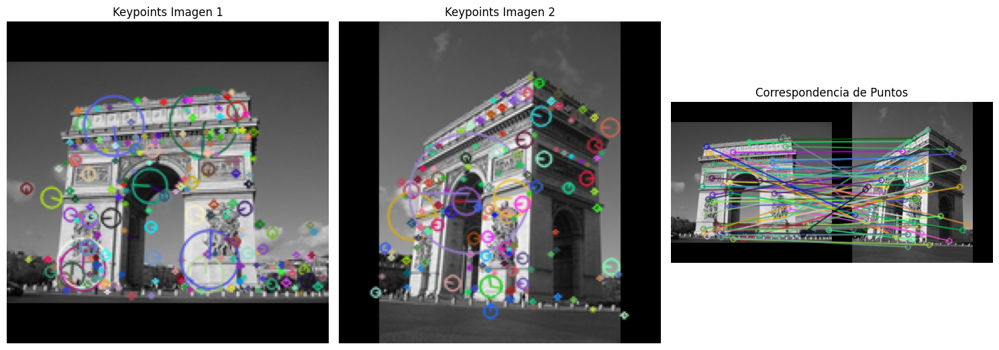

In [124]:
# Se muestran los resultados

plt.figure(figsize=(15, 6))

plt.subplot(1, 3, 1)
plt.title('Keypoints Imagen 1')
plt.imshow(arco1_kp, cmap='gray')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.title('Keypoints Imagen 2')
plt.imshow(arco2_kp, cmap='gray')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.title('Correspondencia de Puntos')
plt.imshow(img_matches)
plt.axis('off')

plt.tight_layout()
plt.show()

In [125]:
print(f"Keypoints en imagen 1: {len(kp1)}")
print(f"Keypoints en imagen 2: {len(kp2)}")
print(f"Cantidad de correspondencias: {len(matches)}")

Keypoints en imagen 1: 256
Keypoints en imagen 2: 182
Cantidad de correspondencias: 62


In [ ]:
# En estas imágenes resultantes se observan los keypoints detectados y sus correspondencias cuando se compara la imagen con cambio de perspectiva.

In [127]:
# Se cargan otras imágenes de prueba

auto1 = cv2.imread("C:/Users/arnic/Desktop/Ariel/MCD/13 - A y T de Imagenes satelitales/TP 4/ImagenesApropiadasTP4/img_7025.png", cv2.IMREAD_GRAYSCALE)  # Imagen original
auto2 = cv2.imread("C:/Users/arnic/Desktop/Ariel/MCD/13 - A y T de Imagenes satelitales/TP 4/ImagenesApropiadasTP4/2drotationExample.png", cv2.IMREAD_GRAYSCALE)  # Imagen a comparar

In [128]:
# Se crea el objeto SIFT

sift2 = cv2.SIFT_create()

# Se detectan keypoints y se calculan descriptores

kp1, des1 = sift2.detectAndCompute(auto1, None)
kp2, des2 = sift2.detectAndCompute(auto2, None)

# Se dibujan los keypoints

auto1_kp = cv2.drawKeypoints(auto1, kp1, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
auto2_kp = cv2.drawKeypoints(auto2, kp2, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

# Se emparejan los puntos clave usando Brute Force

bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=True)
matches = bf.match(des1, des2)

# Se ordenan los matches por distancia

matches = sorted(matches, key=lambda x: x.distance)

# Se dibujan los matches o correspondencias

img_matches = cv2.drawMatches(auto1, kp1, auto2, kp2, matches, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

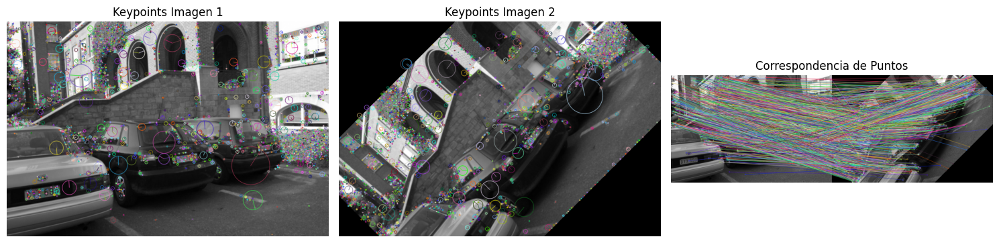

In [129]:
# Se muestran los resultados

plt.figure(figsize=(15, 6))

plt.subplot(1, 3, 1)
plt.title('Keypoints Imagen 1')
plt.imshow(auto1_kp, cmap='gray')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.title('Keypoints Imagen 2')
plt.imshow(auto2_kp, cmap='gray')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.title('Correspondencia de Puntos')
plt.imshow(img_matches)
plt.axis('off')

plt.tight_layout()
plt.show()

In [130]:
print(f"Keypoints en imagen 1: {len(kp1)}")
print(f"Keypoints en imagen 2: {len(kp2)}")
print(f"Cantidad de correspondencias: {len(matches)}")

Keypoints en imagen 1: 2999
Keypoints en imagen 2: 2503
Cantidad de correspondencias: 1864


In [ ]:
# En estas imagenes resultantes se observa una gran cantidad de keyponits y de correspondencias, en este caso, cuando se compara la imagen con cambio de rotación.

In [ ]:
# Se reduce la cantidad de keypoints y sus correspondencias para mejor visualización:

bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=True)
matches = bf.match(des1, des2)

# Se ordenan los matches por distancia

matches = sorted(matches, key=lambda x: x.distance)

# Se dibujan los 100 mejores matches o correspondencias

img_matches = cv2.drawMatches(auto1, kp1, auto2, kp2, matches[:100], None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

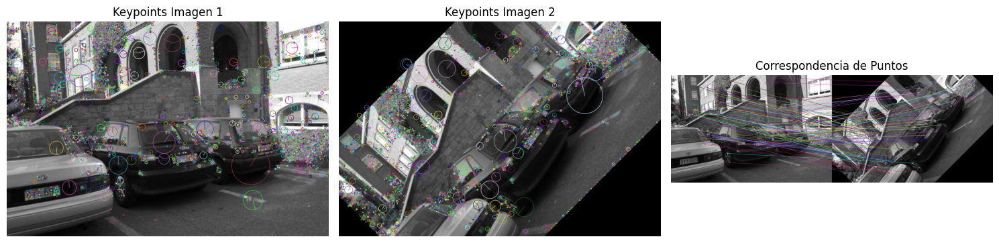

In [132]:
# Se muestran los resultados

plt.figure(figsize=(15, 6))

plt.subplot(1, 3, 1)
plt.title('Keypoints Imagen 1')
plt.imshow(auto1_kp, cmap='gray')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.title('Keypoints Imagen 2')
plt.imshow(auto2_kp, cmap='gray')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.title('Correspondencia de Puntos')
plt.imshow(img_matches)
plt.axis('off')

plt.tight_layout()
plt.show()

In [ ]:
# De esta manera se puede observar la acertada correspondencia entre los keypoints de los objetos (autos) y otros elementos (escalera, edificio) entre la imagen
# y su versión rotada.

In [133]:
# Se cargan otras imágenes para comparar

auto3 = cv2.imread("C:/Users/arnic/Desktop/Ariel/MCD/13 - A y T de Imagenes satelitales/TP 4/ImagenesApropiadasTP4/illuminationExample.png", cv2.IMREAD_GRAYSCALE)  # Imagen a comparar
auto4 = cv2.imread("C:/Users/arnic/Desktop/Ariel/MCD/13 - A y T de Imagenes satelitales/TP 4/ImagenesApropiadasTP4/blurExample.png", cv2.IMREAD_GRAYSCALE)  # Imagen a comparar

In [137]:
# Se crea el objeto SIFT

sift3 = cv2.SIFT_create()

# Se detectan keypoints y se calculan descriptores

kp1, des1 = sift3.detectAndCompute(auto1, None)
kp2, des2 = sift3.detectAndCompute(auto3, None)

# Se dibujan los keypoints

auto1_kp = cv2.drawKeypoints(auto1, kp1, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
auto3_kp = cv2.drawKeypoints(auto3, kp2, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

# Se emparejan los puntos clave usando Brute Force

bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=True)
matches = bf.match(des1, des2)

# Se ordenan los matches por distancia

matches = sorted(matches, key=lambda x: x.distance)

# Se dibujan los 100 mejores matches o correspondencias

img_matches = cv2.drawMatches(auto1, kp1, auto3, kp2, matches[:100], None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

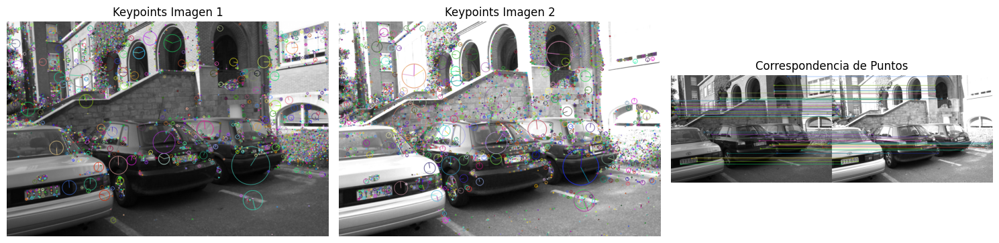

In [138]:
# Se muestran los resultados

plt.figure(figsize=(15, 6))

plt.subplot(1, 3, 1)
plt.title('Keypoints Imagen 1')
plt.imshow(auto1_kp, cmap='gray')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.title('Keypoints Imagen 2')
plt.imshow(auto3_kp, cmap='gray')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.title('Correspondencia de Puntos')
plt.imshow(img_matches)
plt.axis('off')

plt.tight_layout()
plt.show()

In [139]:
print(f"Keypoints en imagen 1: {len(kp1)}")
print(f"Keypoints en imagen 2: {len(kp2)}")
print(f"Cantidad de correspondencias: {len(matches)}")

Keypoints en imagen 1: 2999
Keypoints en imagen 2: 3945
Cantidad de correspondencias: 1777


In [ ]:
# En esta comparación de la imagen con su versión con cambio de iluminación, se observa cómo aumentó la cantidad de keypoints detectados y también, una leve disminución en 
# la cantidad de correspondencias. 

In [140]:
# Se compara con otra versión de la imagen:

sift4 = cv2.SIFT_create()

# Se detectan keypoints y se calculan descriptores

kp1, des1 = sift4.detectAndCompute(auto1, None)
kp2, des2 = sift4.detectAndCompute(auto4, None)

# Se dibujan los keypoints

auto1_kp = cv2.drawKeypoints(auto1, kp1, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
auto4_kp = cv2.drawKeypoints(auto4, kp2, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

# Se emparejan los puntos clave usando Brute Force

bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=True)
matches = bf.match(des1, des2)

# Se ordenan los matches por distancia

matches = sorted(matches, key=lambda x: x.distance)

# Se dibujan los 100 mejores matches o correspondencias

img_matches = cv2.drawMatches(auto1, kp1, auto4, kp2, matches[:100], None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

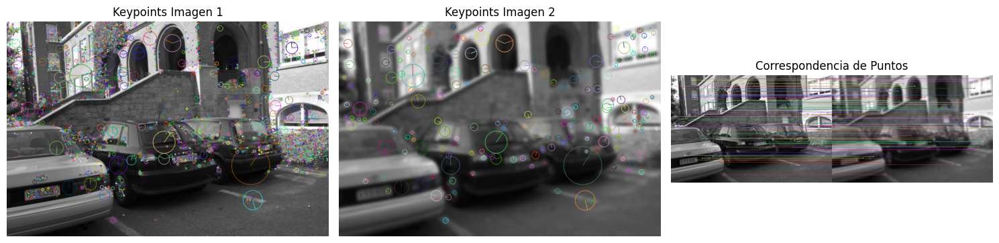

In [141]:
# Se muestran los resultados

plt.figure(figsize=(15, 6))

plt.subplot(1, 3, 1)
plt.title('Keypoints Imagen 1')
plt.imshow(auto1_kp, cmap='gray')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.title('Keypoints Imagen 2')
plt.imshow(auto4_kp, cmap='gray')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.title('Correspondencia de Puntos')
plt.imshow(img_matches)
plt.axis('off')

plt.tight_layout()
plt.show()

In [142]:
print(f"Keypoints en imagen 1: {len(kp1)}")
print(f"Keypoints en imagen 2: {len(kp2)}")
print(f"Cantidad de correspondencias: {len(matches)}")

Keypoints en imagen 1: 2999
Keypoints en imagen 2: 221
Cantidad de correspondencias: 194


In [ ]:
# En este caso, cuando se compara la imagen con su versión blurreada, se observa una abrupta disminución de la cantidad de keyponits detectados, y por ende, una
# disminución de la cantidad de correspondencias. Sin embargo, las correspondencias parecen de buena presición.

In [143]:
# Se cargan otras imágenes de prueba

cuadro1 = cv2.imread("C:/Users/arnic/Desktop/Ariel/MCD/13 - A y T de Imagenes satelitales/TP 4/ImagenesApropiadasTP4/Alonso_El pintor caminante.jpg", cv2.IMREAD_GRAYSCALE)  # Imagen original
cuadro2 = cv2.imread("C:/Users/arnic/Desktop/Ariel/MCD/13 - A y T de Imagenes satelitales/TP 4/ImagenesApropiadasTP4/ElCaminanteAlonso.jpg", cv2.IMREAD_GRAYSCALE)  # Imagen a comparar
cuadro3 = cv2.imread("C:/Users/arnic/Desktop/Ariel/MCD/13 - A y T de Imagenes satelitales/TP 4/ImagenesApropiadasTP4/ElCaminanteAlonso2.jpg", cv2.IMREAD_GRAYSCALE)  # Imagen a comparar
cuadro4 = cv2.imread("C:/Users/arnic/Desktop/Ariel/MCD/13 - A y T de Imagenes satelitales/TP 4/ImagenesApropiadasTP4/ElCaminanteAlonso3.jpg", cv2.IMREAD_GRAYSCALE)  # Imagen a comparar

In [146]:
# Se crea el objeto SIFT

sift5 = cv2.SIFT_create()

# Se detectan keypoints y se calculan descriptores

kp1, des1 = sift5.detectAndCompute(cuadro1, None)
kp2, des2 = sift5.detectAndCompute(cuadro2, None)

# Se dibujan los keypoints

cuadro1_kp = cv2.drawKeypoints(cuadro1, kp1, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
cuadro2_kp = cv2.drawKeypoints(cuadro2, kp2, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

# Se emparejan los puntos clave usando Brute Force

bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=True)
matches = bf.match(des1, des2)

# Se ordenan los matches por distancia

matches = sorted(matches, key=lambda x: x.distance)

# Se dibujan los matches o correspondencias

img_matches = cv2.drawMatches(cuadro1, kp1, cuadro2, kp2, matches, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

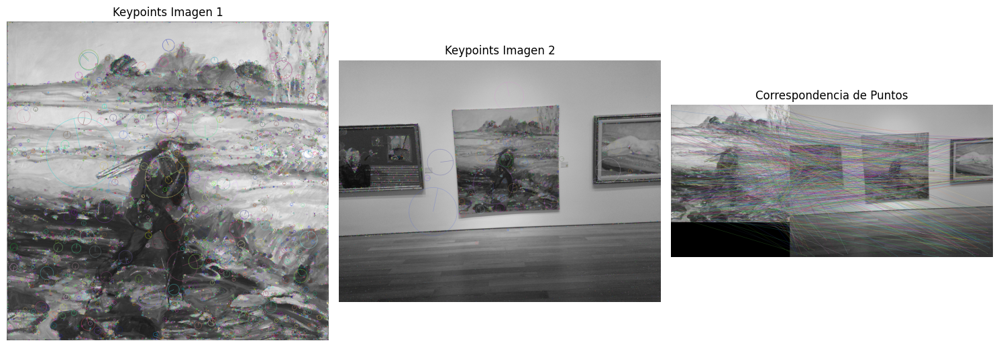

In [147]:
# Se muestran los resultados

plt.figure(figsize=(15, 6))

plt.subplot(1, 3, 1)
plt.title('Keypoints Imagen 1')
plt.imshow(cuadro1_kp, cmap='gray')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.title('Keypoints Imagen 2')
plt.imshow(cuadro2_kp, cmap='gray')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.title('Correspondencia de Puntos')
plt.imshow(img_matches)
plt.axis('off')

plt.tight_layout()
plt.show()

In [148]:
print(f"Keypoints en imagen 1: {len(kp1)}")
print(f"Keypoints en imagen 2: {len(kp2)}")
print(f"Cantidad de correspondencias: {len(matches)}")

Keypoints en imagen 1: 11872
Keypoints en imagen 2: 5019
Cantidad de correspondencias: 1550


In [ ]:
# En estas imágenes resultantes se observa la gran cantidad de keypoints detectados en la imagen original y pranticamente la mitad en su versión con cambio de escala. 
# También se observa muchas correspondencias que no pertenecen al objeto original.

In [149]:
# Se reduce la cantidad de keypoints y sus correspondencias para mejor visualización:

bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=True)
matches = bf.match(des1, des2)

# Se ordenan los matches por distancia

matches = sorted(matches, key=lambda x: x.distance)

# Se dibujan los 100 mejores matches o correspondencias

img_matches = cv2.drawMatches(cuadro1, kp1, cuadro2, kp2, matches[:100], None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

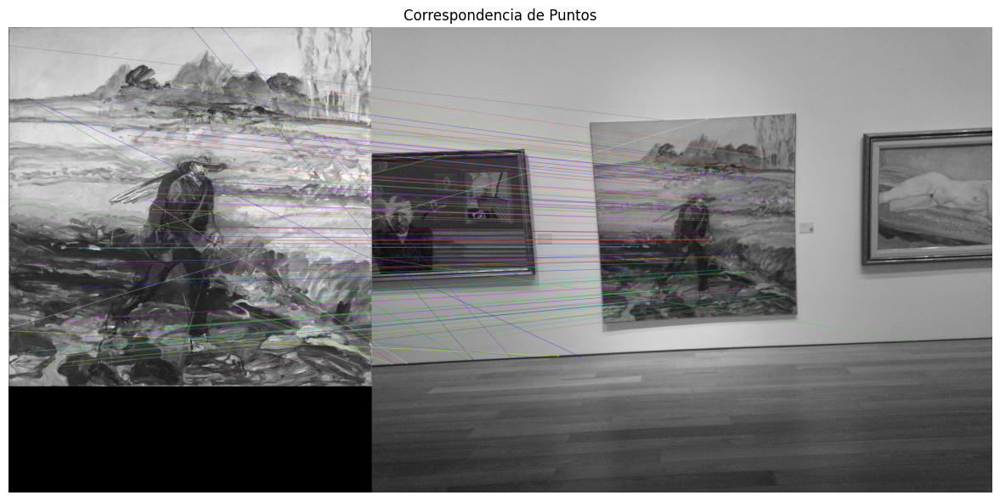

In [151]:
# Se muestran los resultados

plt.figure(figsize=(15, 6))

plt.subplot(1, 1, 1)
plt.title('Correspondencia de Puntos')
plt.imshow(img_matches)
plt.axis('off')

plt.tight_layout()
plt.show()

In [ ]:
# En esta comparación se observan las 100 mejores correspondecias y su presición con el objeto de la imagen con cambio de escala. 

In [ ]:
# Se compara con otra imagen de prueba

sift6 = cv2.SIFT_create()

# Se detectan keypoints y se calculan descriptores

kp1, des1 = sift6.detectAndCompute(cuadro1, None)
kp2, des2 = sift6.detectAndCompute(cuadro4, None)

# Se dibujan los keypoints

cuadro1_kp = cv2.drawKeypoints(cuadro1, kp1, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
cuadro4_kp = cv2.drawKeypoints(cuadro4, kp2, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

# Se emparejan los puntos clave usando Brute Force

bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=True)
matches = bf.match(des1, des2)

# Se ordenan los matches por distancia

matches = sorted(matches, key=lambda x: x.distance)

# Se dibujan los 100 mejores matches o correspondencias

img_matches = cv2.drawMatches(cuadro1, kp1, cuadro4, kp2, matches[:100], None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

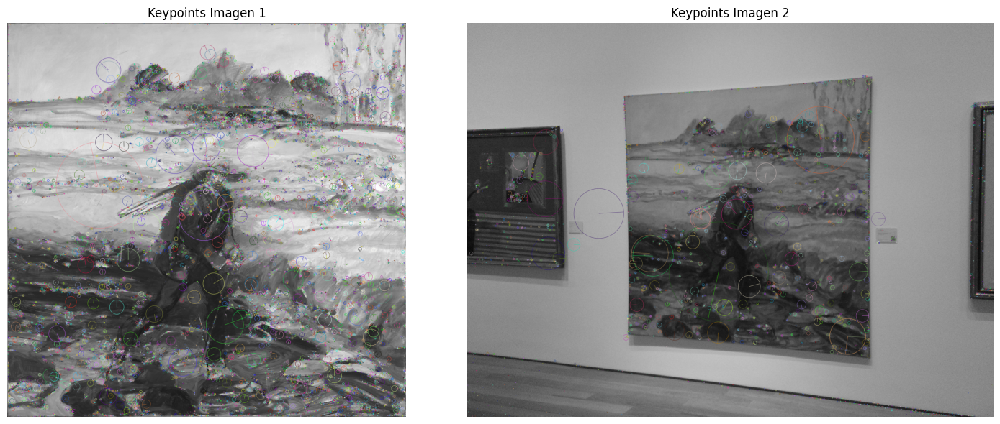

In [158]:
# Se muestran los resultados

plt.figure(figsize=(15, 6))

plt.subplot(1, 2, 1)
plt.title('Keypoints Imagen 1')
plt.imshow(cuadro1_kp, cmap='gray')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.title('Keypoints Imagen 2')
plt.imshow(cuadro4_kp, cmap='gray')
plt.axis('off')

plt.tight_layout()
plt.show()

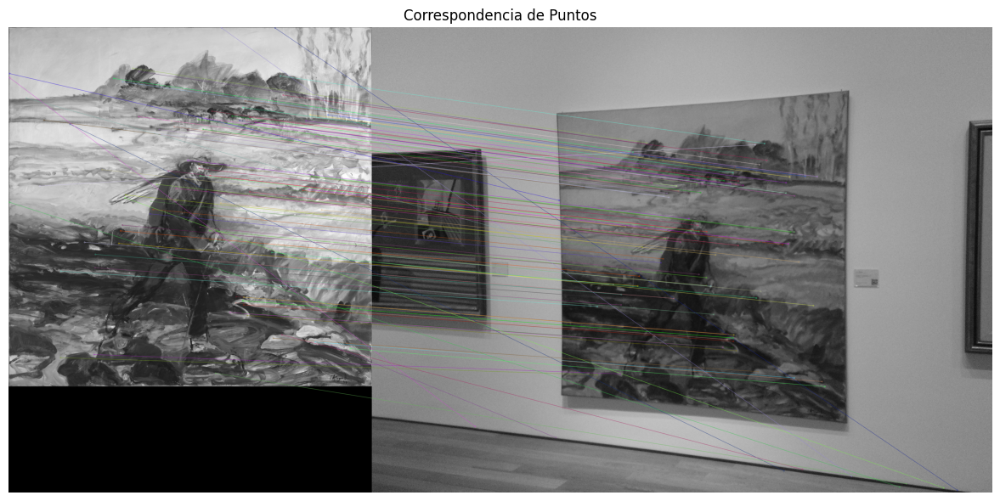

In [159]:
# Se muestran los resultados

plt.figure(figsize=(15, 6))

plt.subplot(1, 1, 1)
plt.title('Correspondencia de Puntos')
plt.imshow(img_matches)
plt.axis('off')

plt.tight_layout()
plt.show()

In [160]:
print(f"Keypoints en imagen 1: {len(kp1)}")
print(f"Keypoints en imagen 2: {len(kp2)}")
print(f"Cantidad de correspondencias: {len(matches)}")

Keypoints en imagen 1: 11872
Keypoints en imagen 2: 2123
Cantidad de correspondencias: 1082


In [ ]:
# En esta comparación de la imagen con su versión con cambio de perspectiva, se observa una abrupta disminución de keypoints. Sin embargo, las 100 mejores correspondencias
# muestran mucha presición con el objeto en perspectiva. 

In [168]:
# Se cargan otras imágenes de prueba

mar1 = cv2.imread("C:/Users/arnic/Desktop/Ariel/MCD/13 - A y T de Imagenes satelitales/TP 4/ImagenesApropiadasTP4/mar1.jpeg", cv2.IMREAD_GRAYSCALE)  # Imagen original
mar2 = cv2.imread("C:/Users/arnic/Desktop/Ariel/MCD/13 - A y T de Imagenes satelitales/TP 4/ImagenesApropiadasTP4/mar2.jpeg", cv2.IMREAD_GRAYSCALE)  # Imagen a comparar

In [169]:
# Se compara con la imagen de prueba

sift7 = cv2.SIFT_create()

# Se detectan keypoints y se calculan descriptores

kp1, des1 = sift7.detectAndCompute(mar1, None)
kp2, des2 = sift7.detectAndCompute(mar2, None)

# Se dibujan los keypoints

mar1_kp = cv2.drawKeypoints(mar1, kp1, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
mar2_kp = cv2.drawKeypoints(mar2, kp2, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

# Se emparejan los puntos clave usando Brute Force

bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=True)
matches = bf.match(des1, des2)

# Se ordenan los matches por distancia

matches = sorted(matches, key=lambda x: x.distance)

# Se dibujan los matches o correspondencias

img_matches = cv2.drawMatches(mar1, kp1, mar2, kp2, matches[:100], None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

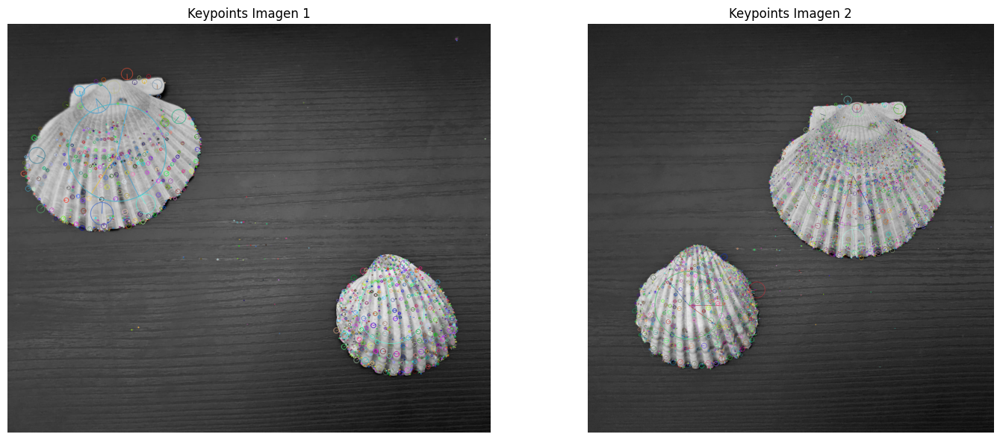

In [171]:
# Se muestran los resultados

plt.figure(figsize=(15, 6))

plt.subplot(1, 2, 1)
plt.title('Keypoints Imagen 1')
plt.imshow(mar1_kp, cmap='gray')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.title('Keypoints Imagen 2')
plt.imshow(mar2_kp, cmap='gray')
plt.axis('off')

plt.tight_layout()
plt.show()

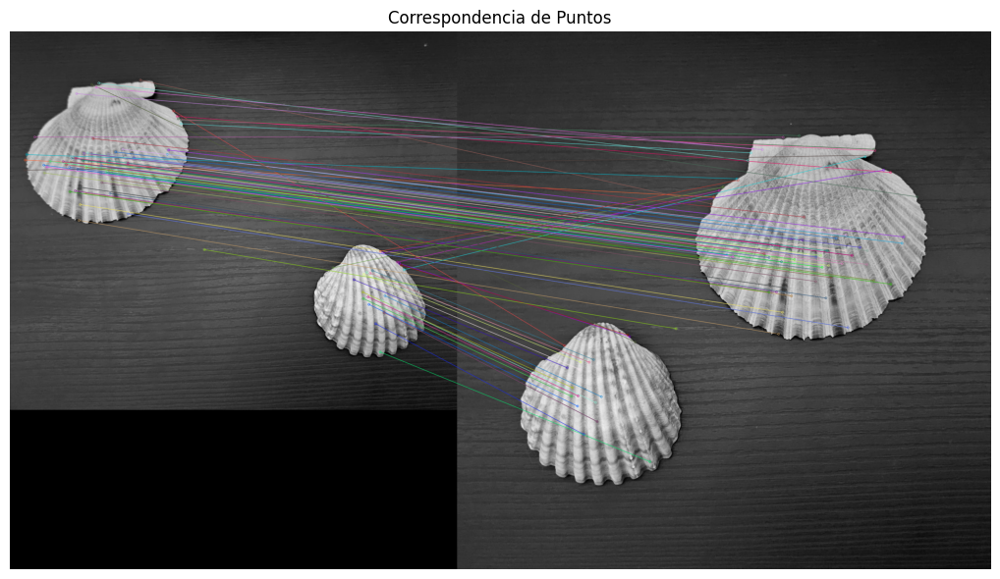

In [172]:
plt.figure(figsize=(15, 6))

plt.subplot(1, 1, 1)
plt.title('Correspondencia de Puntos')
plt.imshow(img_matches)
plt.axis('off')

plt.tight_layout()
plt.show()

In [173]:
print(f"Keypoints en imagen 1: {len(kp1)}")
print(f"Keypoints en imagen 2: {len(kp2)}")
print(f"Cantidad de correspondencias: {len(matches)}")

Keypoints en imagen 1: 1573
Keypoints en imagen 2: 4276
Cantidad de correspondencias: 717


In [ ]:
# En este caso, donde se comparan imágenes con objetos en traslación, se observa un aumento de la cantidad de keypoints, pero baja cantidad de correspondencias.
# Sin embargo, seleccionando las 100 mejores correspondencias, se observa buena presición en los objetos identificados.

In [184]:
# Se cargan imágenes sateliales de prueba

lago1 = cv2.imread("C:/Users/arnic/Desktop/Ariel/MCD/13 - A y T de Imagenes satelitales/TP 4/ImagenesApropiadasTP4/lago.jpg", cv2.IMREAD_GRAYSCALE)  # Imagen original
lago2 = cv2.imread("C:/Users/arnic/Desktop/Ariel/MCD/13 - A y T de Imagenes satelitales/TP 4/ImagenesApropiadasTP4/lago1.jpg", cv2.IMREAD_GRAYSCALE)  # Imagen a comparar

In [185]:
# Se compara con la imagen de prueba

sift8 = cv2.SIFT_create()

# Se detectan keypoints y se calculan descriptores

kp1, des1 = sift8.detectAndCompute(lago1, None)
kp2, des2 = sift8.detectAndCompute(lago2, None)

# Se dibujan los keypoints

lago1_kp = cv2.drawKeypoints(lago1, kp1, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
lago2_kp = cv2.drawKeypoints(lago2, kp2, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

# Se emparejan los puntos clave usando Brute Force

bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=True)
matches = bf.match(des1, des2)

# Se ordenan los matches por distancia

matches = sorted(matches, key=lambda x: x.distance)

# Se dibujan los matches o correspondencias

img_matches = cv2.drawMatches(lago1, kp1, lago2, kp2, matches, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

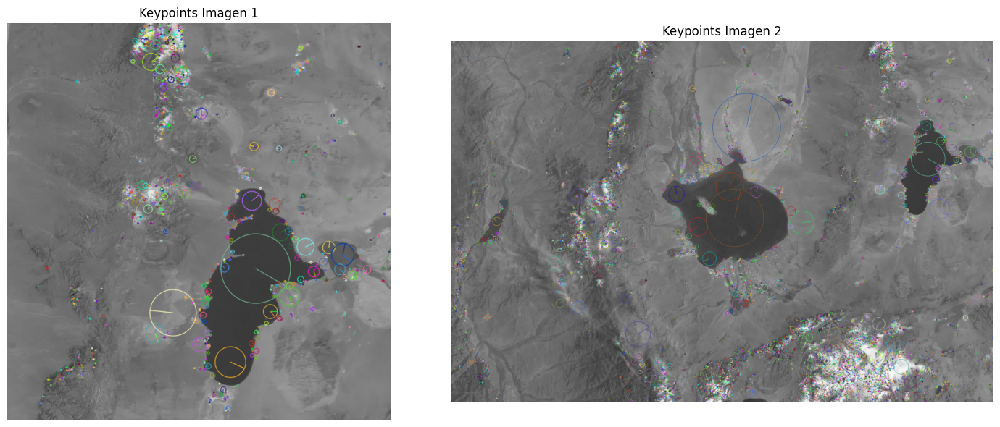

In [186]:
# Se muestran los resultados

plt.figure(figsize=(15, 6))

plt.subplot(1, 2, 1)
plt.title('Keypoints Imagen 1')
plt.imshow(lago1_kp, cmap='gray')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.title('Keypoints Imagen 2')
plt.imshow(lago2_kp, cmap='gray')
plt.axis('off')

plt.tight_layout()
plt.show()

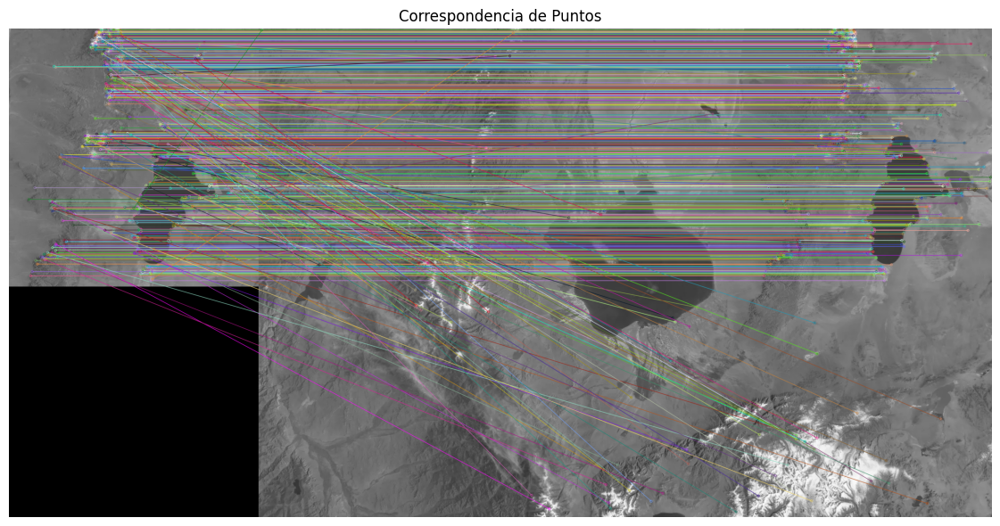

In [187]:
plt.figure(figsize=(15, 6))

plt.subplot(1, 1, 1)
plt.title('Correspondencia de Puntos')
plt.imshow(img_matches)
plt.axis('off')

plt.tight_layout()
plt.show()

In [188]:
print(f"Keypoints en imagen 1: {len(kp1)}")
print(f"Keypoints en imagen 2: {len(kp2)}")
print(f"Cantidad de correspondencias: {len(matches)}")

Keypoints en imagen 1: 771
Keypoints en imagen 2: 6486
Cantidad de correspondencias: 697


In [ ]:
# En este caso, cuando se utilizan imagenes satelitales, se observa una gran cantidad de keypoints en la imagen mayor, y al mismo tiempo, un número de 
# correspondencias casi coincidente con la cantidad de keypoints de la imagen menor, con el objeto (lago). 

In [189]:
# Se dibujan los matches o correspondencias

img_matches = cv2.drawMatches(lago1, kp1, lago2, kp2, matches[:100], None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

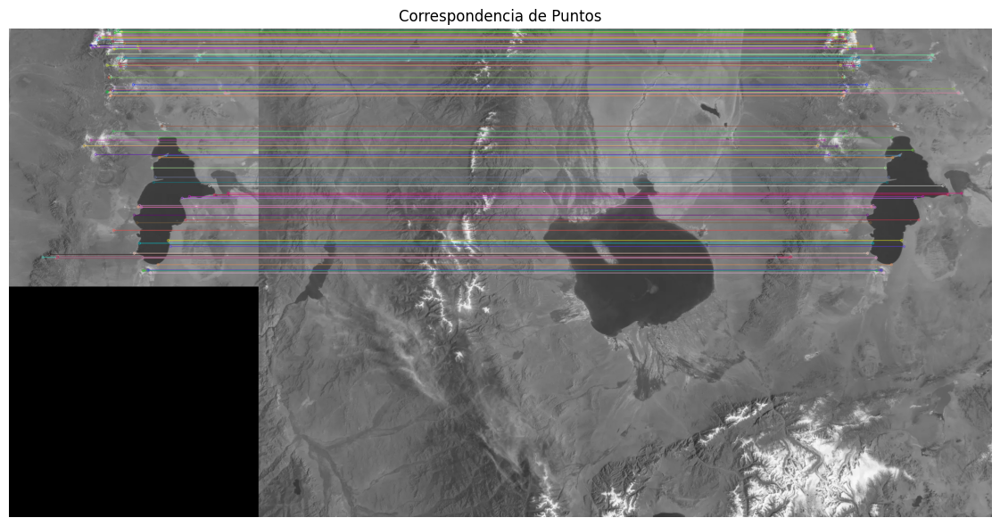

In [190]:
plt.figure(figsize=(15, 6))

plt.subplot(1, 1, 1)
plt.title('Correspondencia de Puntos')
plt.imshow(img_matches)
plt.axis('off')

plt.tight_layout()

In [ ]:
# En esta imagen resultante se observa que, al seleccionar los 100 mejores correspondencias, la coincidencia es practicamente total
# no solo con el lago como objeto, sino también con el relieve característico que forma parte de la imagen.

### 3. Respuesta a las preguntas teóricas:

a) En el método Transformada de Hough, al final del algoritmo, ¿Qué significa que una celda $A_{ij}$ tenga el número 20?

Cuando se aplica la Transformada de Hough para detectar líneas (o círculos, etc.), lo que se hace es transformar puntos del espacio de la imagen $(x,y)$ a un espacio de parámetros.

Para líneas rectas, normalmente se trabaja con la forma polar:
$$
\rho = x cos (\theta) + y sin (\theta)
$$

Cada punto en la imagen vota en el espacio de parámetros para todas las posibles líneas (pares ($\rho,\theta$)) que podrían pasar por él.

El acumulador de Hough es una matriz 2D (para líneas rectas):
 - Eje horizontal: $\theta$ (ángulo de la recta).
 - Eje vertical: $\rho$ (distancia al origen).

Cada celda $A_{ij}$ del acumulador representa un bin (una combinación ($\rho,\theta$)).

Cuando se dice que una celda $A_{ij}$ tiene el número 20, significa que 20 puntos del espacio imagen votaron que la recta definida por esa combinación ($\rho_i,\theta_j$) pasa por ellos.
Es decir, el número indica cuántos puntos de borde detectados son consistentes con esa línea. Si un bin tiene un valor alto, significa que probablemente hay una línea real en la imagen que corresponde a esos parámetros.

b) ¿Qué es el espacio escala Gaussiano?

El espacio de escala Gaussiano (o Gaussian Scale Space) es una representación multiescala de una imagen, que se construye suavizando la imagen original con filtros Gaussianos de diferentes desviaciones estándar ($\sigma$), es decir, que esta integrado por fotos de la misma escena tomadas a diferentes resolución.

La idea clave de este espacio es obtener objetos reales que puedan aparecer más grandes o más pequeños en una imagen según la distancia o zoom y detectar características invariantes a la escala, examinando la imagen a varias escalas.

c) En el método SIFT, ¿qué es un extremo 3D?

En el método SIFT, los keypoints (puntos clave) se detectan buscando extremos locales en una representación multiescala de la imagen. Para eso se construye el espacio de escalas Gaussiano, y luego se calculan imágenes DoG (Diferencia de Gaussianas).

Un extremo 3D es un pico (máximo local) o un mínimo local en un volumen de datos 3D que combina:
 - 2 dimensiones espaciales: la posición del píxel $(x,y)$
 - 1 dimensión de escala: el nivel de suavizado $\sigma$

Por lo tanto, 3D en SIFT = (x,y,escala).